<a href="https://colab.research.google.com/github/rameshgm81/rameshgm81/blob/main/assignment_2_V0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Checkout the github repository https://github.com/computer-vision-spring-25/assignment-2-rameshgm81

In [3]:
import configparser
import os
from google.colab import userdata

In [4]:
# Step 3: Access and print the configuration values
git_username = "rameshgm81"
git_email = "ganti.ramesh@gmail.com"
git_repo = 'computer-vision-spring-25/assignment-2-rameshgm81'
git_repo_folder = 'assignment-2-rameshgm81'

# read from colab key store
git_token = userdata.get('git_token')
git_password = userdata.get('git_password')

In [5]:
!git config --global user.name git_username
!git config --global user.email git_email
!git config --global user.password git_password
!git config --global http.postBuffer 524288000

In [6]:
!echo `pwd`
os.chdir('/content/drive/MyDrive/PGSSP/assignment_2')
!ls -ltr

/content
total 4
drwx------ 2 root root 4096 Feb 11 16:37 assignment-2-rameshgm81


In [ ]:
!git clone https://{git_token}@github.com/{git_repo}

Cloning into 'assignment-2-rameshgm81'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (3/3), done.


In [7]:
os.chdir(git_repo_folder)

!ls -ltr

total 1
-rw------- 1 root root 202 Feb 11 16:37 README.md


In [ ]:
!git status

On branch main
Your branch is up to date with 'origin/main'.

nothing to commit, working tree clean


In [ ]:
!git add .

In [ ]:
!git commit -m 'Document Image Preprocessing, Identify round circle and line detection'

In [ ]:
!git push

Assignment 2 Starts Here

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, TensorDataset

In [24]:
def load_resnet18_for_classification(data_dir, batch_size=32, num_epochs=10, learning_rate=0.001):
    # Check if GPU is available and set the device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the custom dataset from .pt files
    train_data = torch.load(f"{data_dir}/train_data.pt").float()  # Ensure data is of type float
    train_labels = torch.load(f"{data_dir}/train_labels.pt").long()  # Ensure labels are of type long

    # Create a TensorDataset and DataLoader
    train_dataset = TensorDataset(train_data, train_labels)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    # Load the ResNet-18 model
    model = models.resnet18(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(torch.unique(train_labels)))  # Adjust the final layer to match the number of classes
    model = model.to(device)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}")

    print("Training complete")

In [25]:
data_dir = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q1/"
load_resnet18_for_classification(data_dir)

<ipython-input-24-1af9ac069168>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  train_data = torch.load(f"{data_dir}/train_data.pt").float()  # Ensure data is of type float

Epoch 1/10, Loss: 0.9940, Accuracy: 0.6686
Epoch 2/10, Loss: 0.6759, Accuracy: 0.7734
Epoch 3/10, Loss: 0.5394, Accuracy: 0.8186
Epoch 4/10, Loss: 0.4529, Accuracy: 0.8491
Epoch 5/10, Loss: 0.3546, Accuracy: 0.8807
Epoch 6/10, Loss: 0.2781, Accuracy: 0.9059


KeyboardInterrupt: 

**2 Network Visualisation**

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
<ipython-input-32-336738eb5c9b>:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the function

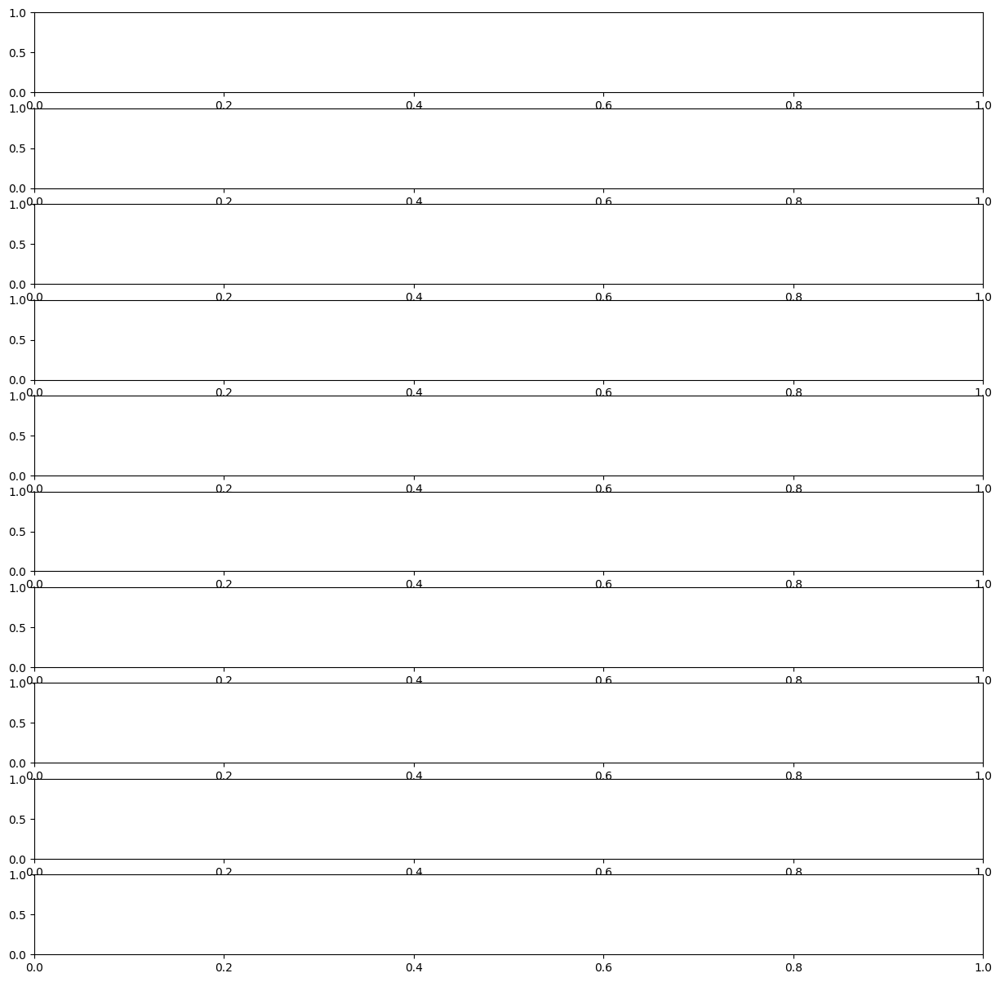

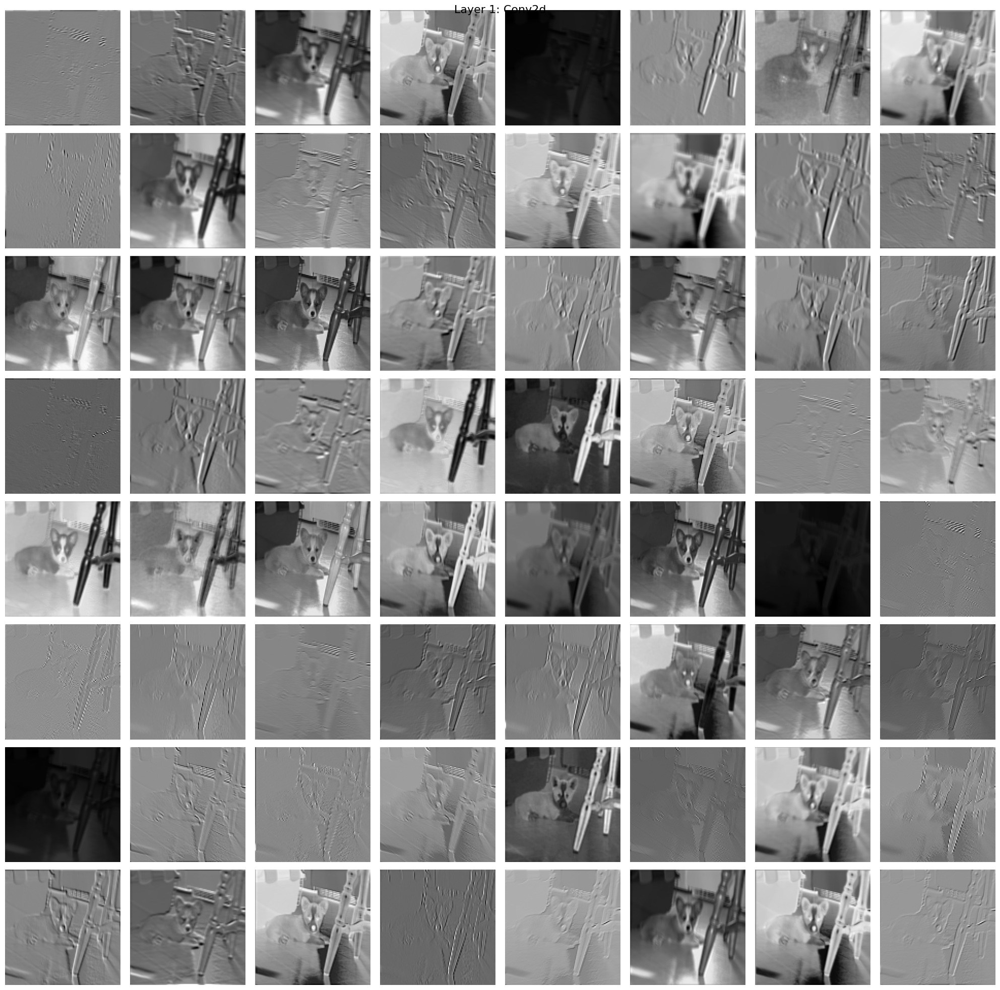

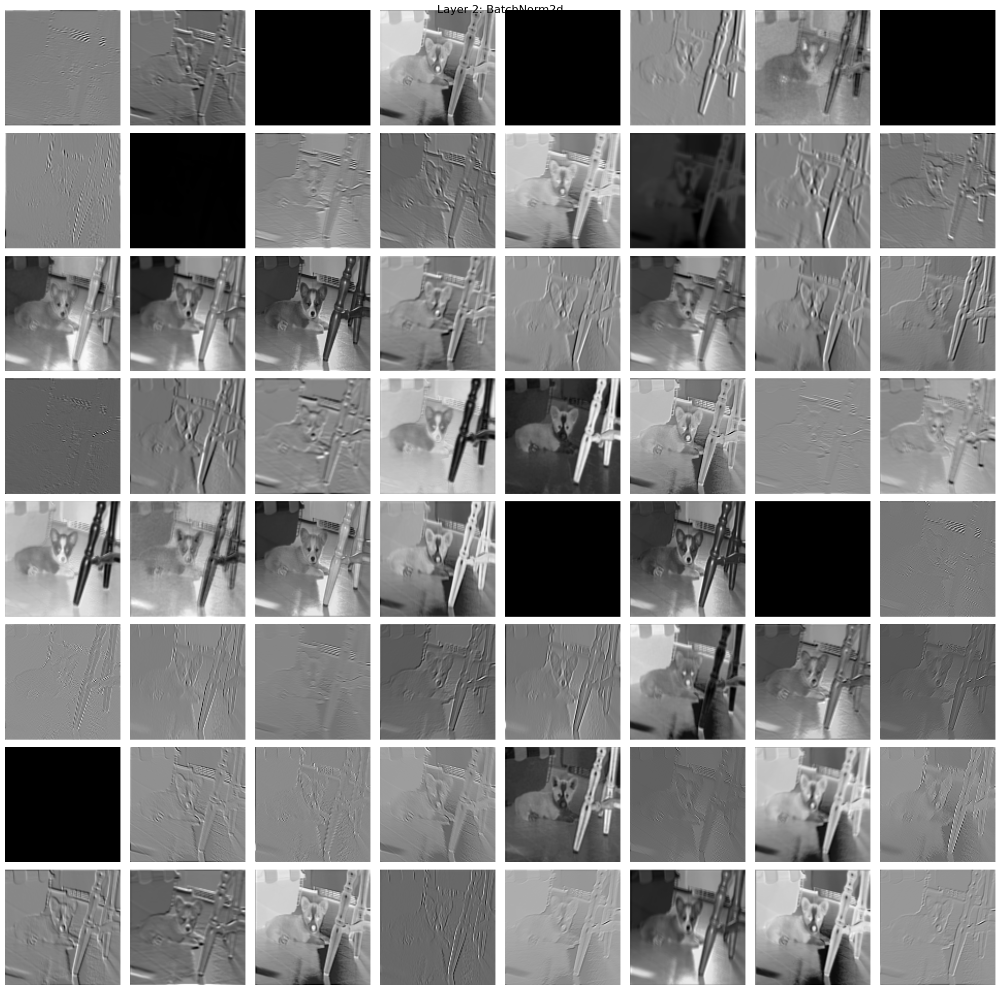

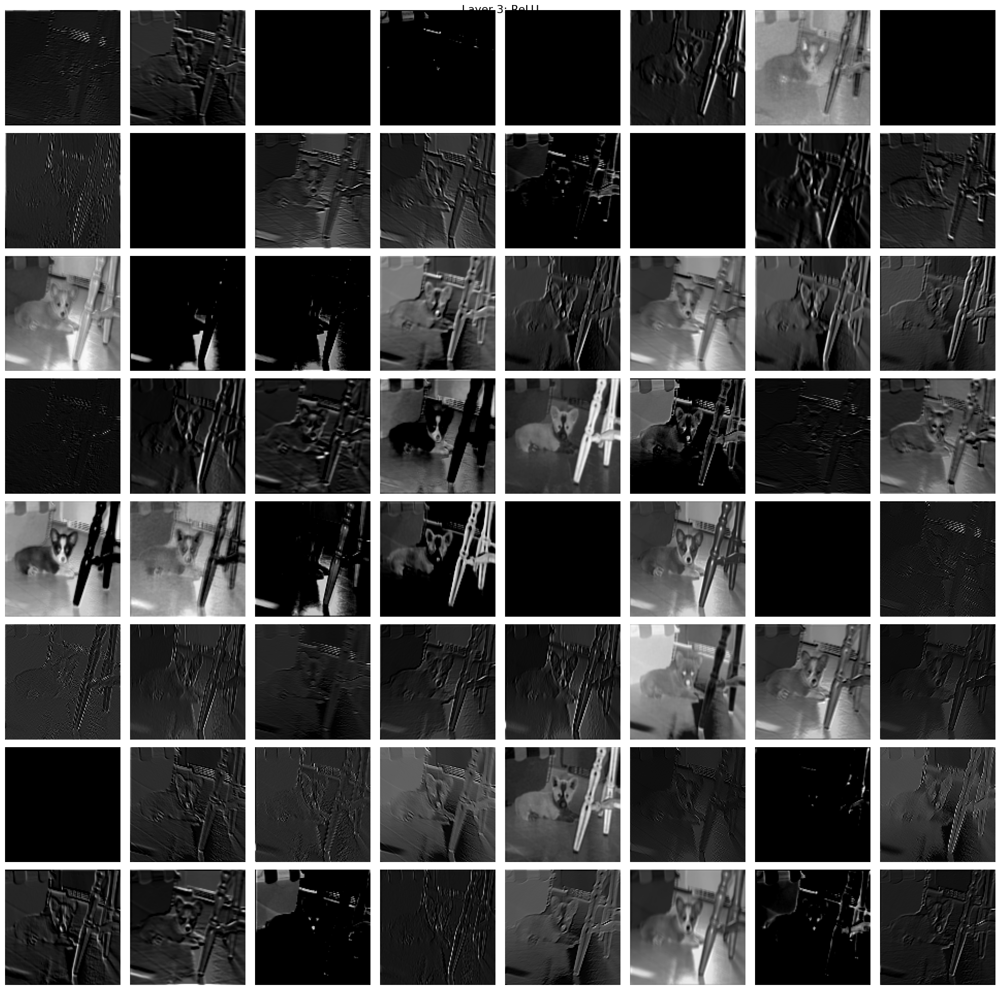

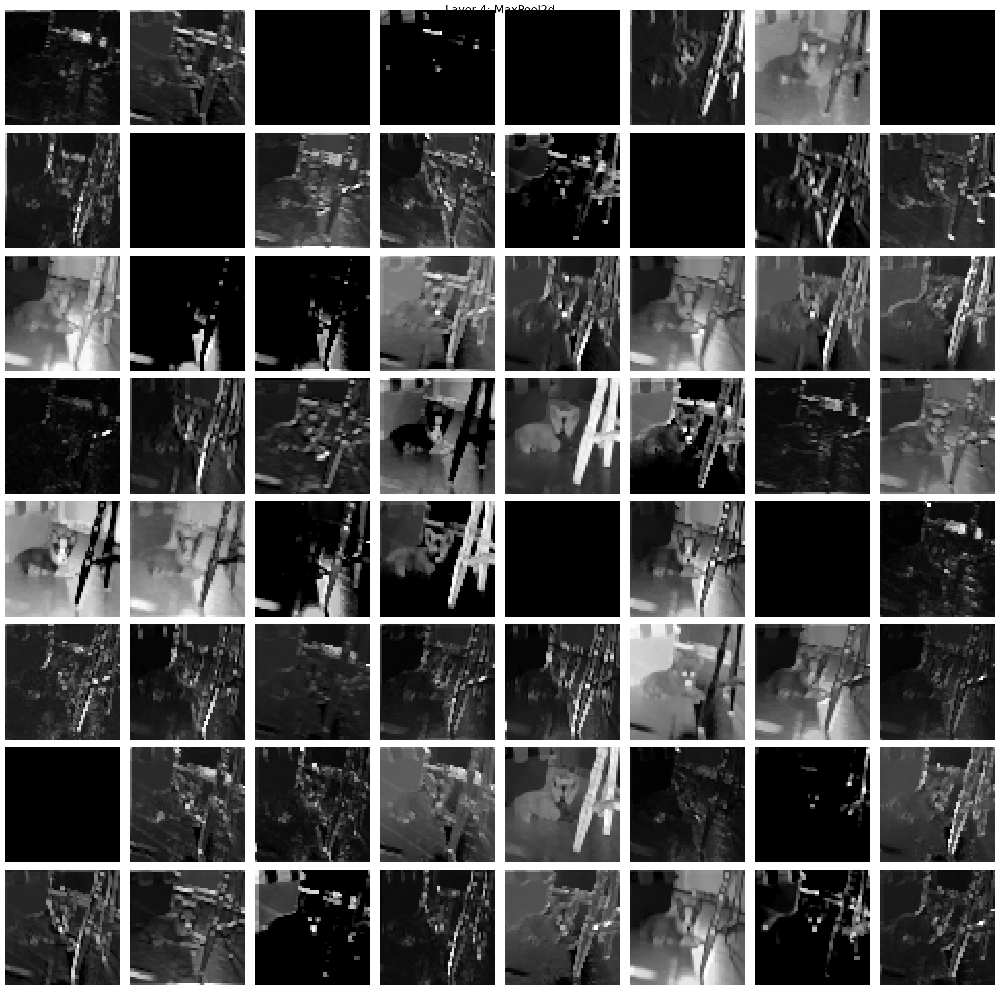

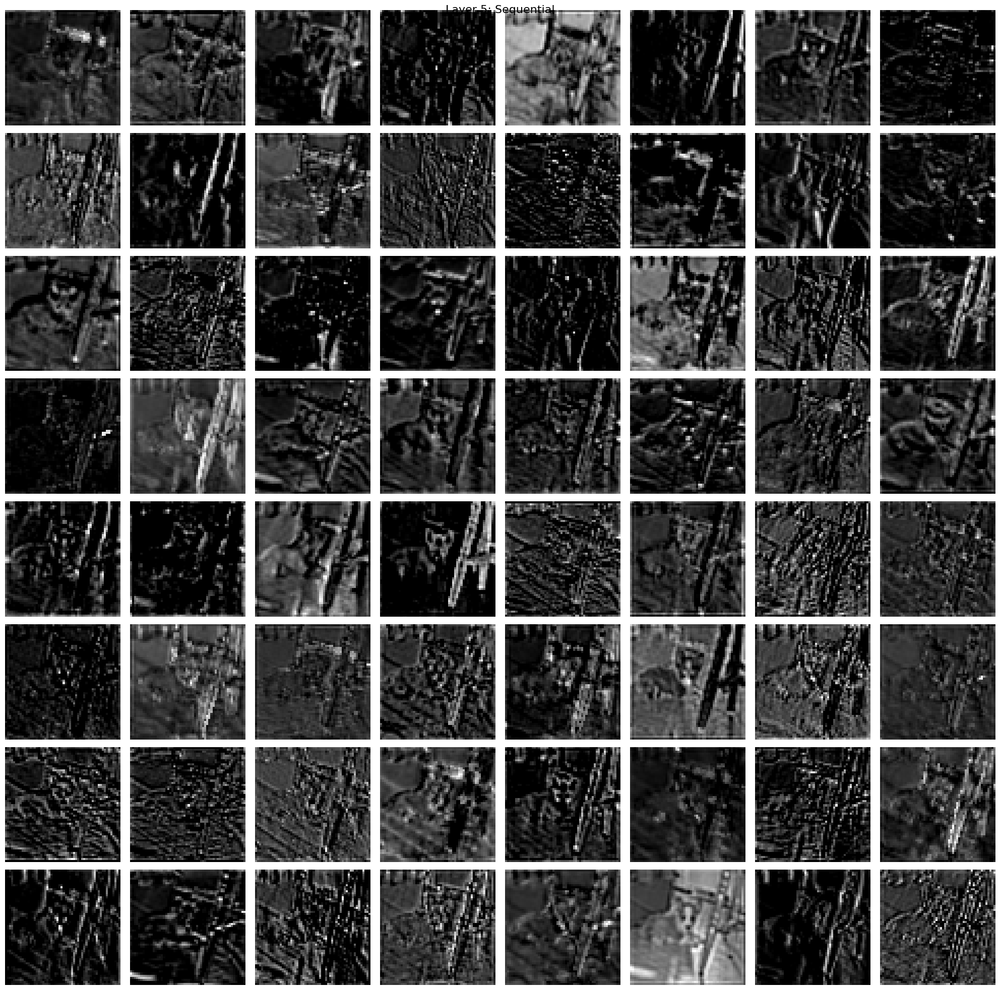

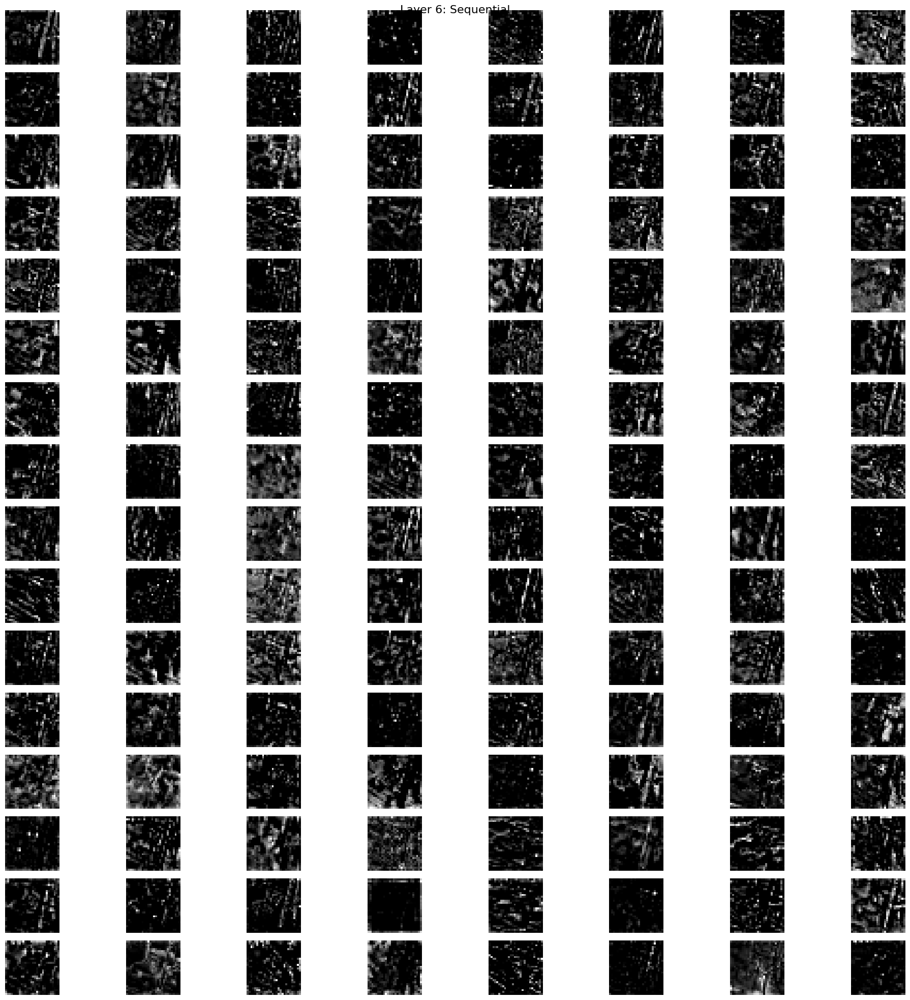

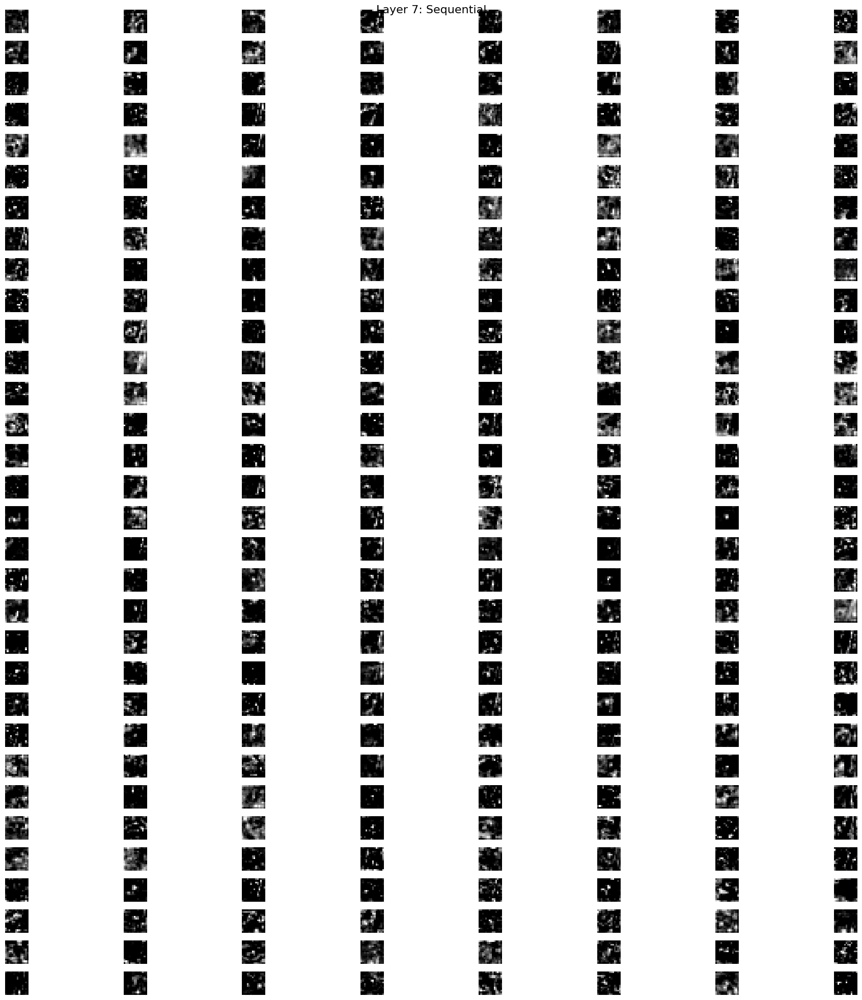

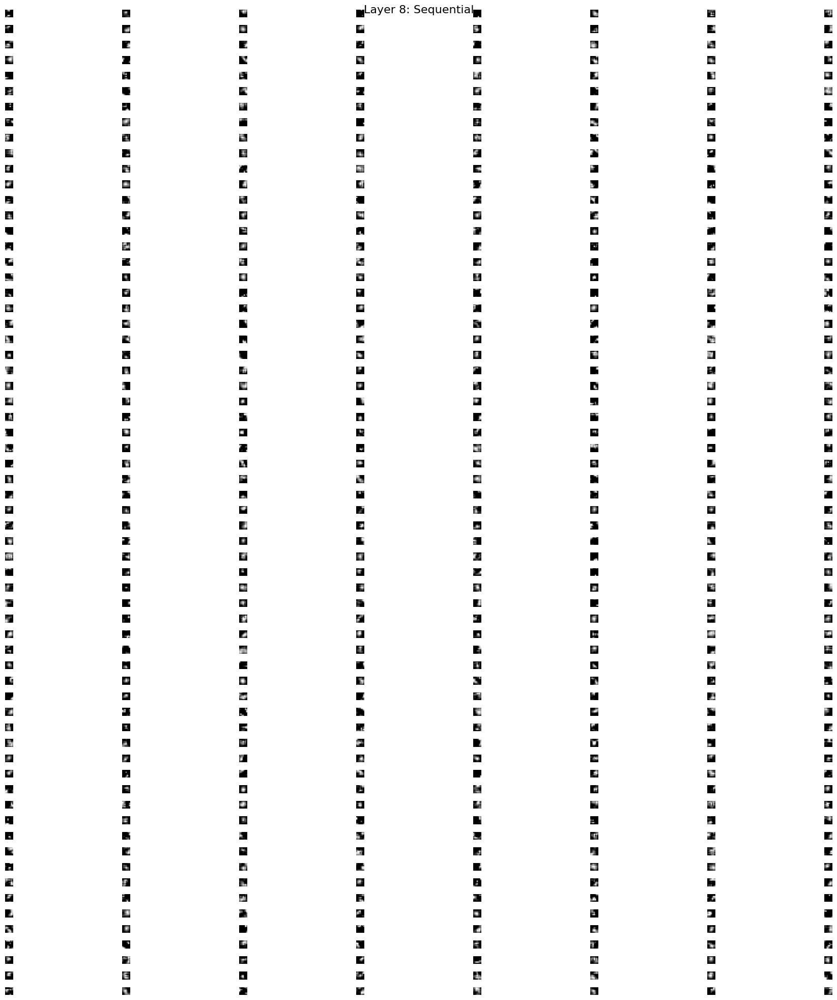

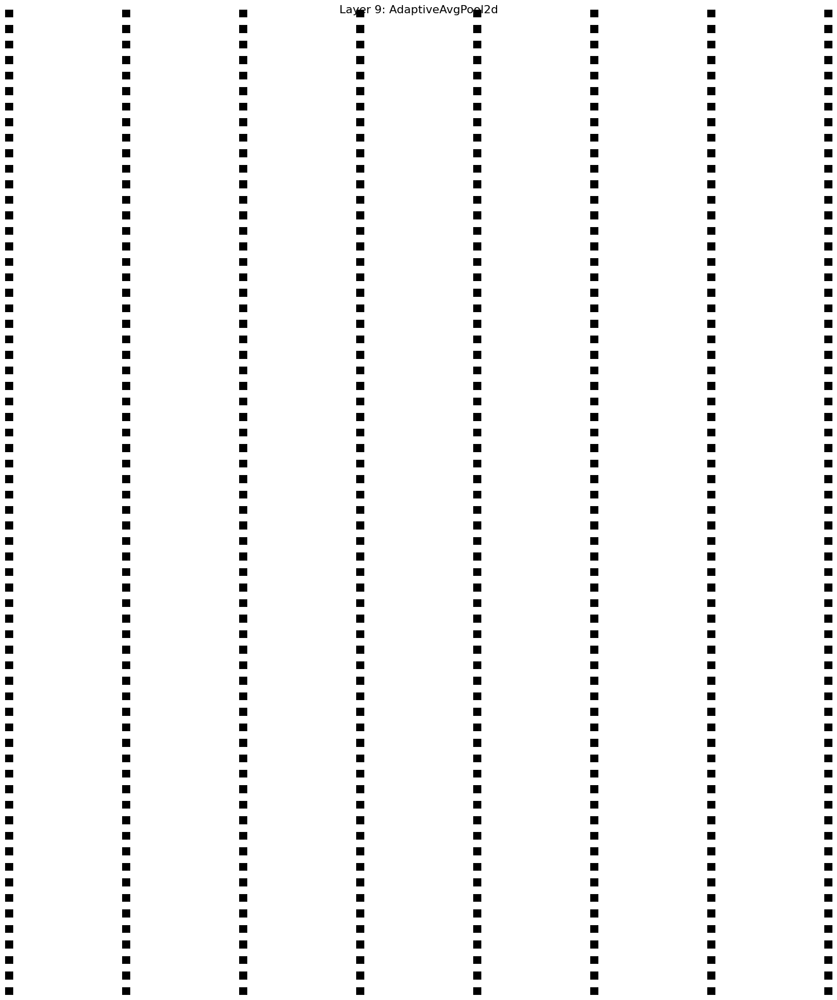

RuntimeError: mat1 and mat2 shapes cannot be multiplied (512x1 and 512x10)

In [32]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid

# Define the mean and standard deviation for normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

NETWORK_VISUALIZATION_PATH = '/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q2/network_visualization.pth'
# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Load the ResNet-18 model
model = models.resnet18(pretrained=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Modify the final layer to have an output size of 1000
model.fc = nn.Linear(model.fc.in_features, 1000)

# Load the pretrained model weights
state_dict = torch.load(NETWORK_VISUALIZATION_PATH, map_location=device)


# Modify the final layer to match the number of classes in the checkpoint
num_classes = state_dict['fc.weight'].shape[0]
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Load the state dict into the model
model.load_state_dict(state_dict)

# Function to visualize the model's feature maps
def visualize_feature_maps(model, image):
    model.eval()
    layers = list(model.children())
    x = image.unsqueeze(0)  # Add batch dimension

    fig, axes = plt.subplots(len(layers), 1, figsize=(15, 15))
    for i, layer in enumerate(layers):
        x = layer(x)
        if isinstance(x, torch.Tensor):
            # Get the number of channels in the feature map
            num_channels = x.shape[1]

            # If the number of channels is more than 4, display multiple subplots
            if num_channels > 4:
                num_cols = 8  # You can adjust the number of columns
                num_rows = int(np.ceil(num_channels / num_cols))
                fig_layer, axes_layer = plt.subplots(num_rows, num_cols, figsize=(20, 20))
                fig_layer.suptitle(f'Layer {i+1}: {layer.__class__.__name__}', fontsize=16)

                for j in range(num_channels):
                    row = j // num_cols
                    col = j % num_cols
                    grid = make_grid(x[:, j, :, :].unsqueeze(1), normalize=True, scale_each=True) # Selecting a single channel
                    npimg = grid.numpy()
                    axes_layer[row, col].imshow(np.transpose(npimg, (1, 2, 0)))
                    axes_layer[row, col].axis('off')

                plt.tight_layout()
                plt.show()
            else:
                # If the number of channels is less than or equal to 4, display as usual
                grid = make_grid(x, normalize=True, scale_each=True)
                npimg = grid.numpy()
                axes[i].imshow(np.transpose(npimg, (1, 2, 0)))
                axes[i].set_title(f'Layer {i+1}: {layer.__class__.__name__}')
                axes[i].axis('off')

    plt.tight_layout()
    plt.show()


# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image path)
    from PIL import Image
    image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q2/network_visualization/corgi/corgi_1.JPEG"
    image = Image.open(image_path)
    image = transform(image)

    # Visualize the feature maps
    visualize_feature_maps(model, image)

**2.1 Saliency Maps**

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


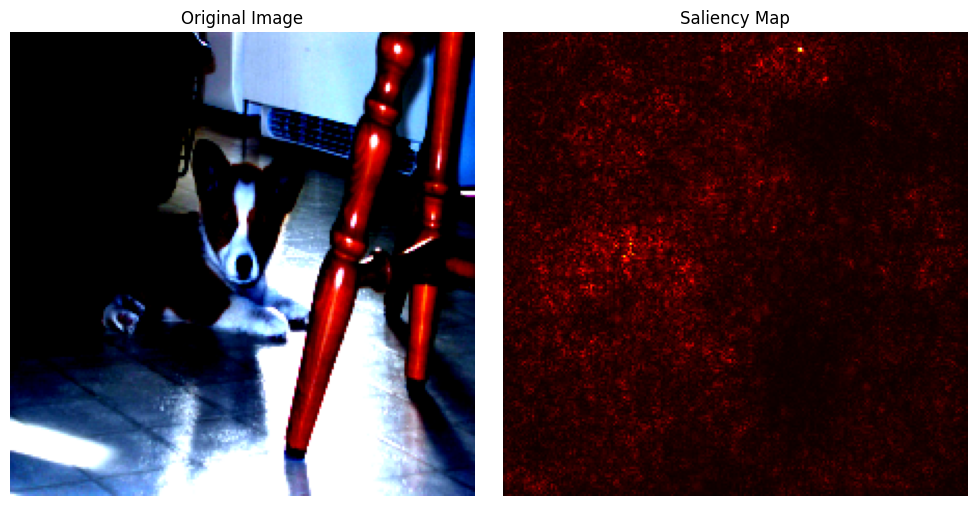

In [33]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Define the mean and standard deviation for normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Load the ResNet-18 model
model = models.resnet18(pretrained=True)
model.eval()

# Function to compute saliency map
def compute_saliency_map(model, image, label):
    image = image.unsqueeze(0)  # Add batch dimension
    image.requires_grad_()  # Enable gradient computation

    # Forward pass
    output = model(image)
    loss = output[0, label]

    # Backward pass
    model.zero_grad()
    loss.backward()

    # Get the gradient of the input image
    saliency, _ = torch.max(image.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()

    return saliency

# Function to visualize saliency map
def visualize_saliency_map(saliency, image):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image.permute(1, 2, 0).cpu().numpy())
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(saliency, cmap=plt.cm.hot)
    plt.title('Saliency Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image path)
    image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q2/network_visualization/corgi/corgi_1.JPEG"
    image = Image.open(image_path)
    image = transform(image)

    # Define the correct class label (replace with the actual label)
    label = 0  # Example label

    # Compute saliency map
    saliency = compute_saliency_map(model, image, label)

    # Visualize saliency map
    visualize_saliency_map(saliency, image)

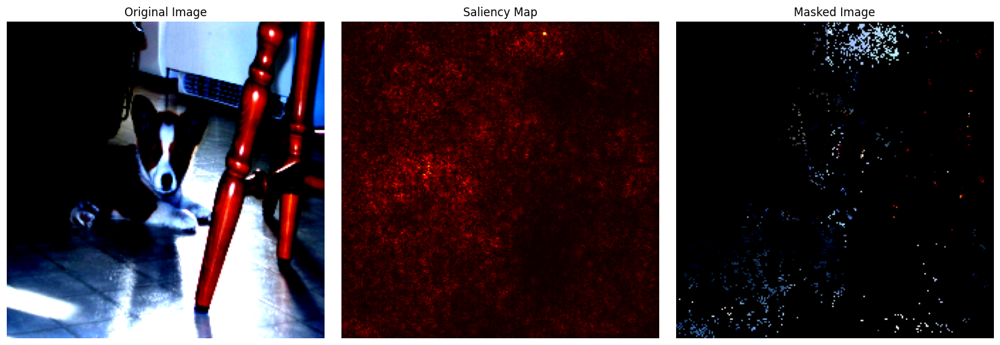

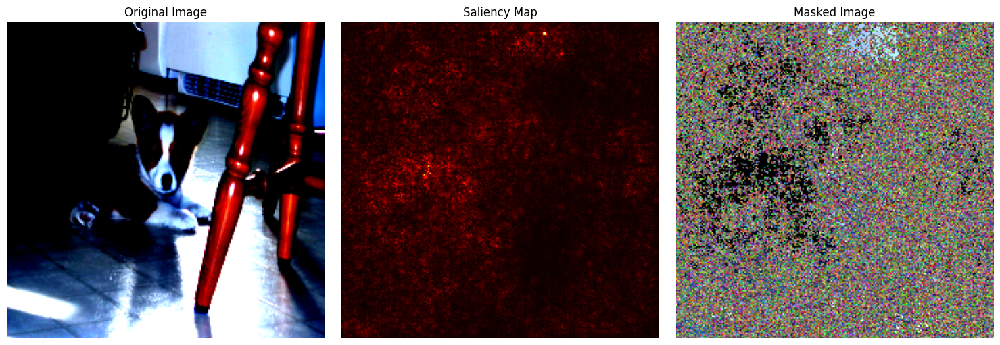

In [35]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Define the mean and standard deviation for normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Load the ResNet-18 model
model = models.resnet18(pretrained=True)
model.eval()

# Function to compute saliency map
def compute_saliency_map(model, image, label):
    image = image.unsqueeze(0)  # Add batch dimension
    image.requires_grad_()  # Enable gradient computation

    # Forward pass
    output = model(image)
    loss = output[0, label]

    # Backward pass
    model.zero_grad()
    loss.backward()

    # Get the gradient of the input image
    saliency, _ = torch.max(image.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()

    return saliency

# Function to mask out pixels based on saliency map
def mask_pixels(image, saliency, threshold, mode='constant'):
    mask = saliency < threshold
    masked_image = image.clone()

    if mode == 'constant':
        masked_image[:, mask] = 0
    elif mode == 'gaussian':
        noise = torch.randn_like(masked_image) * torch.tensor(std, dtype=torch.float32).view(3, 1, 1) + torch.tensor(mean, dtype=torch.float32).view(3, 1, 1)
        masked_image[:, mask] = noise[:, mask]

    return masked_image

# Function to visualize saliency map and masked image
def visualize_results(saliency, original_image, masked_image):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image.permute(1, 2, 0).cpu().numpy())
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(saliency, cmap=plt.cm.hot)
    plt.title('Saliency Map')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(masked_image.permute(1, 2, 0).cpu().numpy())
    plt.title('Masked Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image path)
    image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q2/network_visualization/corgi/corgi_1.JPEG"
    image = Image.open(image_path)
    image = transform(image)

    # Define the correct class label (replace with the actual label)
    label = 0  # Example label

    # Compute saliency map
    saliency = compute_saliency_map(model, image, label)

    # Define the threshold for masking
    threshold = np.percentile(saliency, 90)  # Example threshold

    # Mask out pixels with constant value
    masked_image_constant = mask_pixels(image, saliency, threshold, mode='constant')

    # Mask out pixels with Gaussian noise
    masked_image_gaussian = mask_pixels(image, saliency, threshold, mode='gaussian')

    # Visualize results for constant value masking
    visualize_results(saliency, image, masked_image_constant)

    # Visualize results for Gaussian noise masking
    visualize_results(saliency, image, masked_image_gaussian)

**2.2 Fooling the network**

Prediction: 227, Correct: False


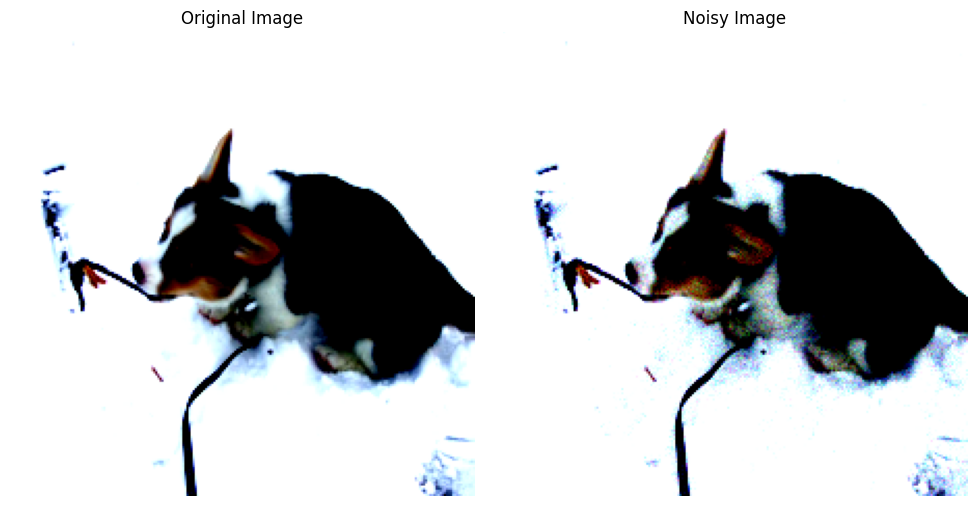

In [36]:
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the mean and standard deviation for normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Load the ResNet-18 model
model = models.resnet18(pretrained=True)
model.eval()

# Function to add Gaussian noise to an image
def add_gaussian_noise(image, mean=0.0, std=0.1):
    noise = torch.randn(image.size()) * std + mean
    noisy_image = image + noise
    return torch.clamp(noisy_image, 0, 1)

# Function to test the accuracy of the network with noisy images
def test_accuracy_with_noise(model, image, label, noise_std=0.1):
    noisy_image = add_gaussian_noise(image, std=noise_std)
    noisy_image = noisy_image.unsqueeze(0)  # Add batch dimension

    # Forward pass
    output = model(noisy_image)
    _, predicted = torch.max(output, 1)

    # Check if the prediction is correct
    is_correct = (predicted.item() == label)
    return is_correct, predicted.item()

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image path)
    image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q2/network_visualization/corgi/corgi_3.JPEG"
    image = Image.open(image_path)
    image = transform(image)

    # Define the correct class label (replace with the actual label)
    label = 0  # Example label

    # Test the accuracy with noisy images
    is_correct, predicted_label = test_accuracy_with_noise(model, image, label, noise_std=0.1)

    # Print the result
    print(f"Prediction: {predicted_label}, Correct: {is_correct}")

    # Visualize the original and noisy images
    noisy_image = add_gaussian_noise(image, std=0.1)
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image.permute(1, 2, 0).cpu().numpy())
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(noisy_image.permute(1, 2, 0).cpu().numpy())
    plt.title('Noisy Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

make the image vector a learnable parameter,
while freezing the rest of the network. Over a couple of epochs,
maximize the logits for a class other than the groundtruth, forcing the network
to optimize the image for the custom class, causing misclassifications
in the network.

(a) For an image, maximize the logits for the class with the next highest
probability.

(b) Maximize the logits for the class with the lowest probability


Epoch 1/10, Loss: -10.89326000213623
Epoch 2/10, Loss: -5.301053524017334
Epoch 3/10, Loss: -13.716333389282227
Epoch 4/10, Loss: -20.649005889892578
Epoch 5/10, Loss: -29.388050079345703
Epoch 6/10, Loss: -38.34286880493164
Epoch 7/10, Loss: -46.13899230957031
Epoch 8/10, Loss: -51.485595703125
Epoch 9/10, Loss: -60.672447204589844
Epoch 10/10, Loss: -69.16028594970703
Epoch 1/10, Loss: 5.001345157623291
Epoch 2/10, Loss: -2.7328712940216064
Epoch 3/10, Loss: -11.464225769042969
Epoch 4/10, Loss: -24.415618896484375
Epoch 5/10, Loss: -35.473793029785156
Epoch 6/10, Loss: -45.40302658081055
Epoch 7/10, Loss: -48.77992248535156
Epoch 8/10, Loss: -61.68393325805664
Epoch 9/10, Loss: -68.8223648071289
Epoch 10/10, Loss: -74.23168182373047


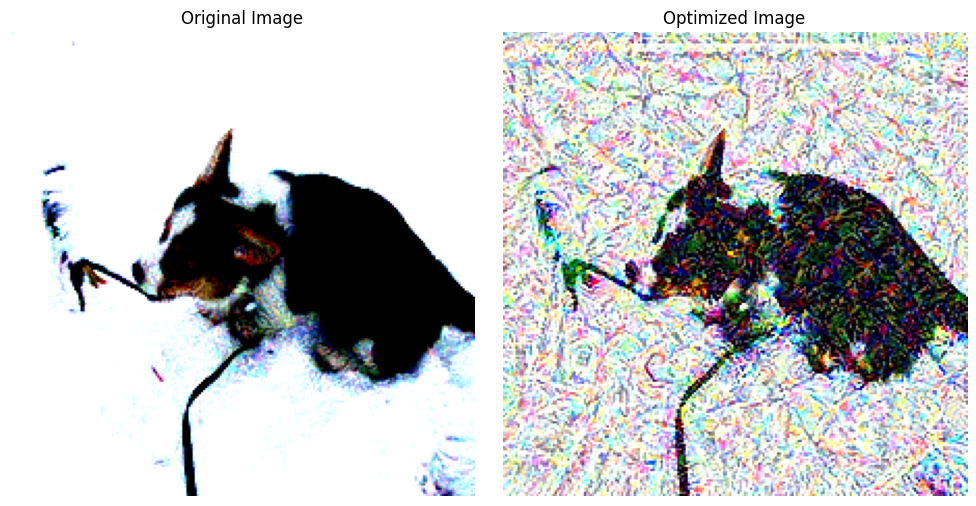

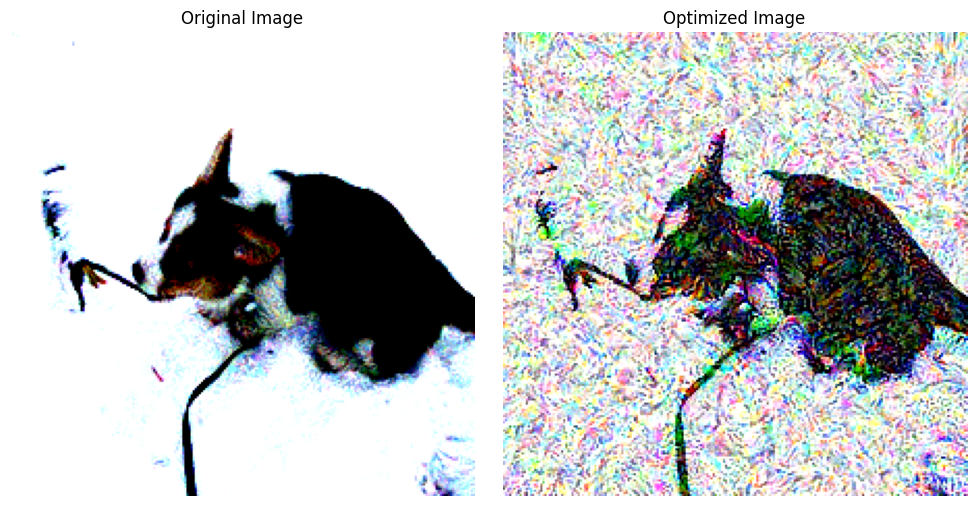

In [2]:
import torch
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the mean and standard deviation for normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Load the ResNet-18 model
model = models.resnet18(pretrained=True)
model.eval()

# Freeze the rest of the network
for param in model.parameters():
    param.requires_grad = False

# Function to optimize the image for a custom class
def optimize_image_for_class(model, image, target_class, num_epochs=10, learning_rate=0.1):
    image = image.unsqueeze(0)  # Add batch dimension
    image.requires_grad_()  # Make the image a learnable parameter

    optimizer = optim.Adam([image], lr=learning_rate)

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        output = model(image)
        loss = -output[0, target_class]  # Maximize the logit for the target class
        loss.backward()
        optimizer.step()

        # Clamp the image to ensure pixel values are within the valid range [0, 1]
        image.data = torch.clamp(image.data, 0, 1)

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")

    return image

# Function to visualize the original and optimized images
def visualize_images(original_image, optimized_image):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(original_image.permute(1, 2, 0).cpu().detach().numpy())
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(optimized_image.squeeze().permute(1, 2, 0).cpu().detach().numpy())
    plt.title('Optimized Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Load an example image (replace with your image path)
    image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q2/network_visualization/corgi/corgi_3.JPEG"
    image = Image.open(image_path)
    image = transform(image)

    # Forward pass to get the initial predictions
    image = image.unsqueeze(0)  # Add batch dimension
    output = model(image)
    _, predicted = torch.max(output, 1)
    original_class = predicted.item()

    # (a) Maximize the logits for the class with the next highest probability
    sorted_indices = torch.argsort(output, descending=True)
    target_class_next_highest = sorted_indices[0, 1].item()  # Second highest probability class

    optimized_image_next_highest = optimize_image_for_class(model, image.squeeze(), target_class_next_highest)

    # (b) Maximize the logits for the class with the lowest probability
    target_class_lowest = sorted_indices[0, -1].item()  # Lowest probability class

    optimized_image_lowest = optimize_image_for_class(model, image.squeeze(), target_class_lowest)

    # Visualize the original and optimized images for the next highest probability class
    visualize_images(image.squeeze(), optimized_image_next_highest)

    # Visualize the original and optimized images for the lowest probability class
    visualize_images(image.squeeze(), optimized_image_lowest)

3. Style Transfer

 3.1 Loss Function


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:08<00:00, 64.6MB/s]


Step 0, Total Loss: 0.018081819638609886
Step 100, Total Loss: 0.41984984278678894
Step 200, Total Loss: 0.14910566806793213
Step 300, Total Loss: 0.10701411217451096
Step 400, Total Loss: 0.24360236525535583
Step 500, Total Loss: 0.4797709584236145
Step 600, Total Loss: 0.2946377992630005
Step 700, Total Loss: 0.3325883746147156
Step 800, Total Loss: 0.27852433919906616
Step 900, Total Loss: 0.8858073949813843
Step 1000, Total Loss: 0.10715947300195694
Step 1100, Total Loss: 1.0469086170196533
Step 1200, Total Loss: 0.5596683025360107
Step 1300, Total Loss: 0.2489013820886612
Step 1400, Total Loss: 2.2717461585998535
Step 1500, Total Loss: 1.3537614345550537
Step 1600, Total Loss: 1.8025341033935547
Step 1700, Total Loss: 0.8856446743011475
Step 1800, Total Loss: 1.0489518642425537
Step 1900, Total Loss: 2.1501059532165527


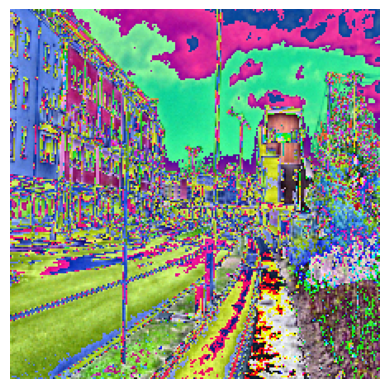

In [3]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the VGG19 model
vgg = models.vgg19(pretrained=True).features

# Freeze the parameters of the model
for param in vgg.parameters():
    param.requires_grad = False

# Function to load and preprocess the image
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

# Function to calculate the content loss
def content_loss(content_features, target_features):
    return torch.mean((content_features - target_features) ** 2)

# Function to calculate the Gram matrix
def gram_matrix(features):
    (b, c, h, w) = features.size()
    features = features.view(b * c, h * w)
    gram = torch.mm(features, features.t())
    return gram.div(b * c * h * w)

# Function to calculate the style loss
def style_loss(style_grams, target_features):
    target_grams = [gram_matrix(target) for target in target_features]
    loss = 0
    for target_gram, style_gram in zip(target_grams, style_grams):
        loss += torch.mean((target_gram - style_gram) ** 2)
    return loss

# Function to extract features from the model
def get_features(image, model, layers=None):
    if layers is None:
        layers = {
            '0': 'conv1_1',
            '5': 'conv2_1',
            '10': 'conv3_1',
            '19': 'conv4_1',
            '21': 'conv4_2',  # Content layer
            '28': 'conv5_1'
        }
    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features

# Example usage
if __name__ == "__main__":
    content_image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q3/content/town.jpg"
    style_image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q3/styles/landscape-with-a-palace.jpg"

    content_image = load_image(content_image_path)
    style_image = load_image(style_image_path)

    content_features = get_features(content_image, vgg)
    style_features = get_features(style_image, vgg)

    style_grams = [gram_matrix(style_features[layer]) for layer in style_features]

    # Example target image (initialized as a copy of the content image)
    target_image = content_image.clone().requires_grad_(True)

    # Define the optimizer
    optimizer = torch.optim.Adam([target_image], lr=0.003)

    # Define the weights for content and style loss
    content_weight = 1e4
    style_weight = 1e2

    # Training loop
    num_steps = 2000
    for step in range(num_steps):
        target_features = get_features(target_image, vgg)

        c_loss = content_loss(content_features['conv4_2'], target_features['conv4_2'])
        s_loss = style_loss(style_grams, [target_features[layer] for layer in style_features])

        total_loss = content_weight * c_loss + style_weight * s_loss

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        if step % 100 == 0:
            print(f"Step {step}, Total Loss: {total_loss.item()}")

    # Convert the target image to displayable format
    target_image = target_image.squeeze().detach().cpu()
    target_image = transforms.ToPILImage()(target_image)

    # Display the target image
    plt.imshow(target_image)
    plt.axis('off')
    plt.show()

**3.2 Gradient Descent**

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 93.1MB/s]


Step 0, Total Loss: 0.018081819638609886
Step 100, Total Loss: 9381.0771484375
Step 200, Total Loss: 5036.623046875
Step 300, Total Loss: 3592.230712890625
Step 400, Total Loss: 2840.74609375
Step 500, Total Loss: 2357.765625
Step 600, Total Loss: 2022.48681640625
Step 700, Total Loss: 1776.583740234375
Step 800, Total Loss: 1589.17333984375
Step 900, Total Loss: 1442.72802734375
Step 1000, Total Loss: 1323.7337646484375
Step 1100, Total Loss: 1225.5858154296875
Step 1200, Total Loss: 1144.3232421875
Step 1300, Total Loss: 1074.198486328125
Step 1400, Total Loss: 1013.5446166992188
Step 1500, Total Loss: 959.0321655273438
Step 1600, Total Loss: 911.5735473632812
Step 1700, Total Loss: 868.8670654296875
Step 1800, Total Loss: 830.4754638671875
Step 1900, Total Loss: 795.867431640625


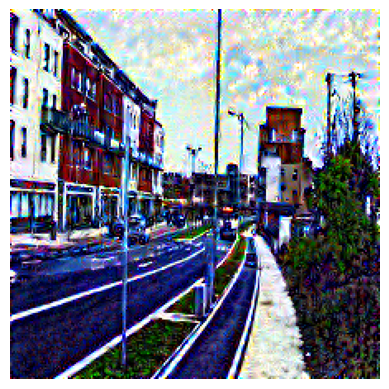

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the VGG19 model
vgg = models.vgg19(pretrained=True).features

# Freeze the parameters of the model
for param in vgg.parameters():
    param.requires_grad = False

# Function to load and preprocess the image
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

# Function to calculate the content loss
def content_loss(content_features, target_features):
    return torch.mean((content_features - target_features) ** 2)

# Function to calculate the Gram matrix
def gram_matrix(features):
    (b, c, h, w) = features.size()
    features = features.view(b * c, h * w)
    gram = torch.mm(features, features.t())
    return gram.div(b * c * h * w)

# Function to calculate the style loss
def style_loss(style_grams, target_features):
    target_grams = [gram_matrix(target) for target in target_features]
    loss = 0
    for target_gram, style_gram in zip(target_grams, style_grams):
        loss += torch.mean((target_gram - style_gram) ** 2)
    return loss

# Function to extract features from the model
def get_features(image, model, layers=None):
    if layers is None:
        layers = {
            '0': 'conv1_1',
            '5': 'conv2_1',
            '10': 'conv3_1',
            '19': 'conv4_1',
            '21': 'conv4_2',  # Content layer
            '28': 'conv5_1'
        }
    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features

# Function to perform style transfer
def style_transfer(content_image_path, style_image_path, num_steps=2000, content_weight=1e4, style_weight=1e2):
    content_image = load_image(content_image_path)
    style_image = load_image(style_image_path)

    content_features = get_features(content_image, vgg)
    style_features = get_features(style_image, vgg)

    style_grams = [gram_matrix(style_features[layer]) for layer in style_features]

    # Initialize the target image as a copy of the content image
    target_image = content_image.clone().requires_grad_(True)

    # Define the optimizer
    optimizer = optim.Adam([target_image], lr=0.003)

    for step in range(num_steps):
        target_features = get_features(target_image, vgg)

        c_loss = content_loss(content_features['conv4_2'], target_features['conv4_2'])
        s_loss = style_loss(style_grams, [target_features[layer] for layer in style_features])

        total_loss = content_weight * c_loss + style_weight * s_loss

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Clamp the image to ensure pixel values are within the valid range [0, 1]
        target_image.data = torch.clamp(target_image.data, 0, 1)

        if step % 100 == 0:
            print(f"Step {step}, Total Loss: {total_loss.item()}")

    # Convert the target image to displayable format
    target_image = target_image.squeeze().detach().cpu()
    target_image = transforms.ToPILImage()(target_image)

    # Display the target image
    plt.imshow(target_image)
    plt.axis('off')
    plt.show()

# Example usage
if __name__ == "__main__":
    content_image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q3/content/town.jpg"
    style_image_path = "/content/drive/MyDrive/PGSSP/dataset_assignment_2/Q3/styles/landscape-with-a-palace.jpg"
    style_transfer(content_image_path, style_image_path)